# 📝 Time Series - Machine Temperature

## 🌟 Highlights 
From this project "Time Series - Machine Temperature", the highlights are addressed as:
- Some approaches are demonstrated: Z score/ ARIMA/ Isolation Forest
- Z score conclusion: Z score is found not reliable as threshold changes over time
- ARIMA conclusion
  - ARIMA order (1, 1, 2) is determined by ACF/PACF and BIC value
  - ARIMA has a fixed threshold as 2.91
  - Residual based anomaly detection is chosen
  - ARIMA forecasting on test period follows too well on actual data. As a result, the residual remains small at anomaly timestamp, making it not flagged
- Isolation Forest conclusion
  - Approach 1 (train with the whole period): f1 score is 0.58 with 60 mins consistency check. Cons is data leakage (use the whole dataset to choose proper parameters)
  - Approach 2 (train with 70% data and test 30% data and whole data set): f1 score is 0.56 with mins consistency check for whole dataset and 0.73 in test set. Approach 2 is more practical to use since only reference period is used for model training and applies anomaly detection for unknown future with trained model

## ℹ️ Project Introduction 
**What is time series dataset**  
Time series data is data collected sequentially over time (e.g., every minute, hour, or day).  
A key characteristic is temporal dependency: the value at time t is often related to values at earlier times (t-1, t-2, …).  
Due to this specific characteristic, random split of data for analysis is not suitable and will pose a negative effect to the coming outcome.   

**Machine temperature time series data**  
In the manufacturing company, machine generates revenue by producing products.      
However, unexpected machine issue can result in production stop, defective products, and huge recovery cost.    
To balance production efficiency and machine maintenence, companyies rely on machine condition monitor as an important defense.

Among many machine monitor signals, machine operating temperature is one of the most critical indicators of meachine health.  
In this project, a time series dataset records machine operating temperature at different moment.  
By analyzing the relationship between machine temperature and time with time series analysis, many insights can be unveiled for necessary arrangment and action.   

## 🎯 Mission & Goal
As a data scentist working in manufacturing company, my main job is to monitor machine condition and flag any potential abnormality early.  

## 🏭 Build Flow
- Import libraries
- Data cleaning & EDA
- Anomaly detection
  - Z score method and improvement
  - ARIMA forecasting and residual based anomaly detection
  - Isolation forest

## 💡 To Do


### Import Libraries

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import seaborn as sns
import numpy as np
import plotly.express as px
import plotly.graph_objects as go

from itertools import product

from scipy.stats import boxcox
from statsmodels.tsa.seasonal import STL
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.stattools import acf
from statsmodels.tsa.stattools import pacf
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf
from statsmodels.tsa.arima.model import ARIMA

from sklearn.ensemble import IsolationForest
from sklearn.metrics import classification_report, confusion_matrix

### Data cleaning & EDA
- Data collection frequency
- Data type correction
- Separate datetime for convinient filter
- Missing data
- Add label data into dataframe
- Visualization

In [2]:
file = r'D:\coding\2026\time_series_analysis\realKnownCause\realKnownCause\machine_temperature_system_failure.csv'

df = pd.read_csv(file)
df.head(10)

,timestamp,value
0,2013-12-02 21:15:00,73.967322
1,2013-12-02 21:20:00,74.935882
2,2013-12-02 21:25:00,76.124162
3,2013-12-02 21:30:00,78.140707
4,2013-12-02 21:35:00,79.329836
5,2013-12-02 21:40:00,78.710418
6,2013-12-02 21:45:00,80.269784
7,2013-12-02 21:50:00,80.272828
8,2013-12-02 21:55:00,80.353425
9,2013-12-02 22:00:00,79.486523


Data is collected every 5 mins

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22695 entries, 0 to 22694
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   timestamp  22695 non-null  object 
 1   value      22695 non-null  float64
dtypes: float64(1), object(1)
memory usage: 354.7+ KB


timestamp column is not datetime data type 

In [4]:
# Change timestamp to datetime
df['time'] = pd.to_datetime(df['timestamp'])
df.head()

,timestamp,value,time
0,2013-12-02 21:15:00,73.967322,2013-12-02 21:15:00
1,2013-12-02 21:20:00,74.935882,2013-12-02 21:20:00
2,2013-12-02 21:25:00,76.124162,2013-12-02 21:25:00
3,2013-12-02 21:30:00,78.140707,2013-12-02 21:30:00
4,2013-12-02 21:35:00,79.329836,2013-12-02 21:35:00


In [5]:
# Separate year, month, date, hour, min out to columns (convenient for filter purpose)
df['year'] = df['time'].apply(lambda x: x.year)
df['month'] = df['time'].apply(lambda x: x.month)
df['day'] = df['time'].apply(lambda x: x.day)
df['hour'] = df['time'].apply(lambda x: x.hour)
df['minute'] = df['time'].apply(lambda x: x.minute)
df

,timestamp,value,time,year,month,day,hour,minute
0,2013-12-02 21:15:00,73.967322,2013-12-02 21:15:00,2013,12,2,21,15
1,2013-12-02 21:20:00,74.935882,2013-12-02 21:20:00,2013,12,2,21,20
2,2013-12-02 21:25:00,76.124162,2013-12-02 21:25:00,2013,12,2,21,25
3,2013-12-02 21:30:00,78.140707,2013-12-02 21:30:00,2013,12,2,21,30
4,2013-12-02 21:35:00,79.329836,2013-12-02 21:35:00,2013,12,2,21,35
...,...,...,...,...,...,...,...,...
22690,2014-02-19 15:05:00,98.185415,2014-02-19 15:05:00,2014,2,19,15,5
22691,2014-02-19 15:10:00,97.804168,2014-02-19 15:10:00,2014,2,19,15,10
22692,2014-02-19 15:15:00,97.135468,2014-02-19 15:15:00,2014,2,19,15,15
22693,2014-02-19 15:20:00,98.056852,2014-02-19 15:20:00,2014,2,19,15,20


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22695 entries, 0 to 22694
Data columns (total 8 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   timestamp  22695 non-null  object        
 1   value      22695 non-null  float64       
 2   time       22695 non-null  datetime64[ns]
 3   year       22695 non-null  int64         
 4   month      22695 non-null  int64         
 5   day        22695 non-null  int64         
 6   hour       22695 non-null  int64         
 7   minute     22695 non-null  int64         
dtypes: datetime64[ns](1), float64(1), int64(5), object(1)
memory usage: 1.4+ MB


In [7]:
print(df.shape)
df['value'].isnull().value_counts()

(22695, 8)


False    22695
Name: value, dtype: int64

No missing data

#### Add label data into dataframe
- Add label (find [here](https://github.com/numenta/NAB/blob/master/labels/combined_labels.json))
- Add label window (find [here](https://github.com/numenta/NAB/blob/master/labels/combined_windows.json))

In [8]:
anomaly_label = [
        "2013-12-11 06:00:00",
        "2013-12-16 17:25:00",
        "2014-01-28 13:55:00",
        "2014-02-08 14:30:00"
]

anomaly_window = [
        [
            "2013-12-10 06:25:00.000000",
            "2013-12-12 05:35:00.000000"
        ],
        [
            "2013-12-15 17:50:00.000000",
            "2013-12-17 17:00:00.000000"
        ],
        [
            "2014-01-27 14:20:00.000000",
            "2014-01-29 13:30:00.000000"
        ],
        [
            "2014-02-07 14:55:00.000000",
            "2014-02-09 14:05:00.000000"
        ]
    ]

In [9]:
df['anomaly_point'] = 0
df['anomaly_window'] = 0

'''
anomaly_point:
    1: anomaly; 0: normal
anomaly_window:
    1: anomaly_window; 0: normal
'''

for i in anomaly_label:
    df.loc[df['time'] == i, 'anomaly_point'] = 1

for start, end in anomaly_window:
    df.loc[((df['time'] >= start) & (df['time'] <= end)), 'anomaly_window'] = 1

df.head()

,timestamp,value,time,year,month,day,hour,minute,anomaly_point,anomaly_window
0,2013-12-02 21:15:00,73.967322,2013-12-02 21:15:00,2013,12,2,21,15,0,0
1,2013-12-02 21:20:00,74.935882,2013-12-02 21:20:00,2013,12,2,21,20,0,0
2,2013-12-02 21:25:00,76.124162,2013-12-02 21:25:00,2013,12,2,21,25,0,0
3,2013-12-02 21:30:00,78.140707,2013-12-02 21:30:00,2013,12,2,21,30,0,0
4,2013-12-02 21:35:00,79.329836,2013-12-02 21:35:00,2013,12,2,21,35,0,0


#### Visualization
- Visualize anomaly points
- Visualize anamaly window

In [10]:
df_anomaly_points = df[df['anomaly_point'] == 1]
df_anomaly_points
df_anomaly_windows = df[df['anomaly_window'] == 1]
df_anomaly_windows

,timestamp,value,time,year,month,day,hour,minute,anomaly_point,anomaly_window
2126,2013-12-10 06:25:00,53.886196,2013-12-10 06:25:00,2013,12,10,6,25,0,1
2127,2013-12-10 06:30:00,54.113727,2013-12-10 06:30:00,2013,12,10,6,30,0,1
2128,2013-12-10 06:35:00,53.514577,2013-12-10 06:35:00,2013,12,10,6,35,0,1
2129,2013-12-10 06:40:00,54.920342,2013-12-10 06:40:00,2013,12,10,6,40,0,1
2130,2013-12-10 06:45:00,55.162629,2013-12-10 06:45:00,2013,12,10,6,45,0,1
...,...,...,...,...,...,...,...,...,...,...
19794,2014-02-09 13:45:00,91.330425,2014-02-09 13:45:00,2014,2,9,13,45,0,1
19795,2014-02-09 13:50:00,89.886941,2014-02-09 13:50:00,2014,2,9,13,50,0,1
19796,2014-02-09 13:55:00,88.997810,2014-02-09 13:55:00,2014,2,9,13,55,0,1
19797,2014-02-09 14:00:00,90.408573,2014-02-09 14:00:00,2014,2,9,14,0,0,1


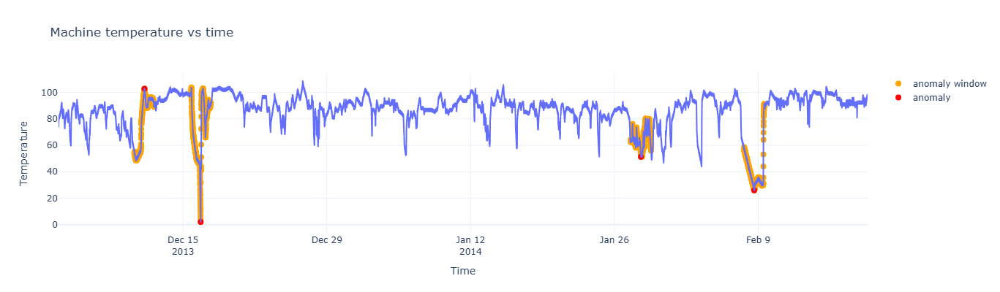

In [11]:
# Visualize line plot - temperature vs time
fig = px.line(df,
        x='time',
        y='value',
        width=1000,
        height=400,
        labels={'time': 'Time', 'value': 'Temperature'},
        template='plotly_white',
        title='Machine temperature vs time')

df_anomaly_points = df[df['anomaly_point'] == 1]
df_anomaly_windows = df[df['anomaly_window'] == 1]

fig.add_trace(go.Scatter(x=df_anomaly_windows['time'],
                         y=df_anomaly_windows['value'],
                         mode='markers',
                         marker=dict(size=8,color='orange',symbol='circle'),
                         name='anomaly window'
                        )
             )

fig.add_trace(go.Scatter(x=df_anomaly_points['time'], 
                         y=df_anomaly_points['value'],
                         mode='markers',
                         marker=dict(size=8,color='red',symbol='circle'),
                         name='anomaly'
                        )
             )


fig.show()

# '''
# This is the matplotlib version for reporting
# plt.figure(figsize=(16, 4.5))
# plt.plot(df['time'], df['value'])
# plt.xlabel('Time')
# plt.ylabel('Temperature')
# plt.xticks(fontsize=8)
# plt.gca().xaxis.set_major_locator(mdates.DayLocator(interval=6))
# plt.grid(True)
# plt.title('Machine temperature over time')
# plt.show()
# '''

Visualize anomalies and windows in the plot
- It is obvious to visually know 2nd and 4th as anomaly point; 1st and 3rd are less straightforward
- Window covers points before and after anomalies. Might be a hint of detection

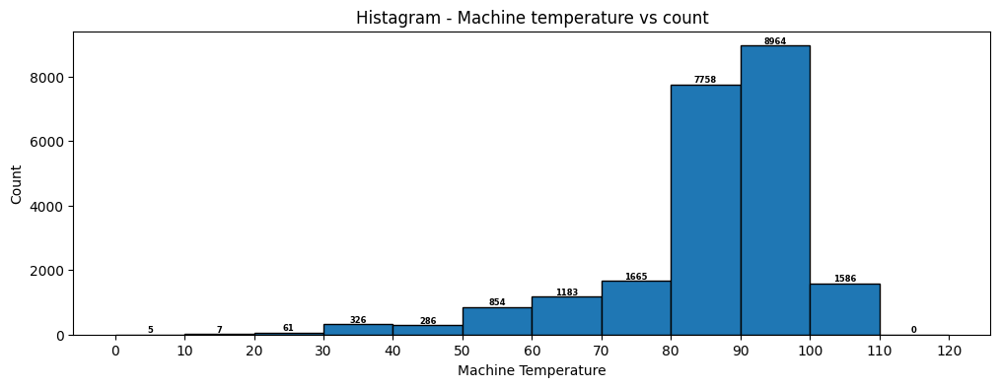

In [12]:
# Histagram
bin_size = range(0, 121, 10)
plt.figure(figsize=(12, 4))
value_count, baredge, bar = plt.hist(df['value'], bins=bin_size, edgecolor='black')

for c, edge, bar_ in zip(value_count, baredge, bar):
    plt.text(
        bar_.get_x() + bar_.get_width() / 2,
        bar_.get_height(),
        int(c),
        ha='center',
        va='bottom',
        fontsize=6,
        fontweight='bold',
        color='black',
    )
plt.xlabel('Machine Temperature')
plt.ylabel('Count')
plt.xticks(bin_size)
plt.title('Histagram - Machine temperature vs count')
plt.show()

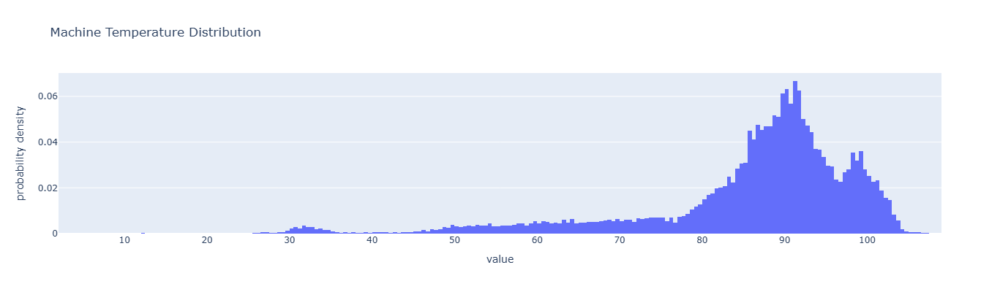

In [13]:
fig = px.histogram(df,
                   x='value', 
                   width=1000,
                   height=400,
                   histnorm="probability density",
                   title='Machine Temperature Distribution'
                  )
fig.update_xaxes(tickmode='array',
                 tickvals=list(range(0, 121, 10)),
                )
fig.show()

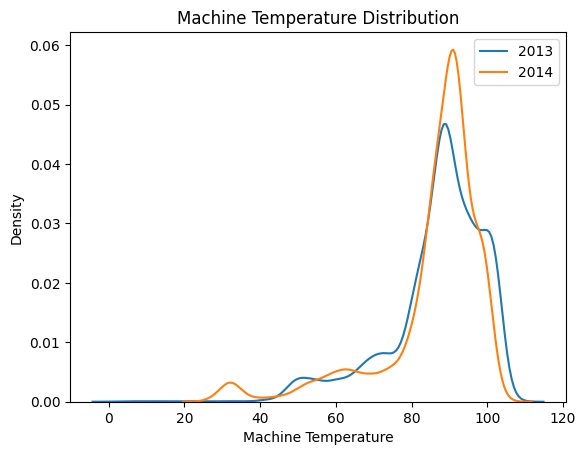

In [14]:
sns.kdeplot(df.loc[df['year']==2013, 'value'], label='2013')
sns.kdeplot(df.loc[df['year']==2014, 'value'], label='2014')

plt.xlabel('Machine Temperature')
plt.legend()
plt.title('Machine Temperature Distribution')
plt.show()

Majority of temperature is around 80~100 degree

### Anomaly Detection
- Z score method
- ARIMA
- Isolation Forest

#### Z score method
- Rolling calculation and threshold calculation
- Visualization function
- Rolling mean & rolling std
- Rolling median & rolling MAD

#### Z score method - Rolling calculation and threshold calculation

In [15]:
# Rolling calculation
rolling_window = 300
df_z_score = df.copy()

# Rolling mean
df_z_score['Rolling Mean'] = df_z_score['value'].rolling(rolling_window).mean()

# Rolling std
df_z_score['Rolling std'] = df_z_score['value'].rolling(rolling_window).std()

# Rolling median
df_z_score['Rolling Median'] = df_z_score['value'].rolling(rolling_window).median()

# Rolling MAD
df_z_score['Rolling MAD'] = df_z_score['value'].rolling(rolling_window).apply(lambda x: (x - x.median()).abs().median())

In [16]:
# Threshold calculation from rolling data
# Threshold from rolling mean and rolling std
df_z_score['Upper bound-mean/std'] = df_z_score['Rolling Mean'] + 3 * df_z_score['Rolling std']
df_z_score['Lower bound-mean/std'] = df_z_score['Rolling Mean'] - 3 * df_z_score['Rolling std']

# Threshold from rolling median and rolling MAD
df_z_score['Upper bound-median/MAD'] = df_z_score['Rolling Median'] + 3 * 1.4826 * df_z_score['Rolling MAD']  # sigma_robust = 1.4826 * rolling MAD
df_z_score['Lower bound-median/MAD'] = df_z_score['Rolling Median'] - 3 * 1.4826 * df_z_score['Rolling MAD']
df_z_score

,timestamp,value,time,year,month,day,hour,minute,anomaly_point,anomaly_window,Rolling Mean,Rolling std,Rolling Median,Rolling MAD,Upper bound-mean/std,Lower bound-mean/std,Upper bound-median/MAD,Lower bound-median/MAD
0,2013-12-02 21:15:00,73.967322,2013-12-02 21:15:00,2013,12,2,21,15,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2013-12-02 21:20:00,74.935882,2013-12-02 21:20:00,2013,12,2,21,20,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2013-12-02 21:25:00,76.124162,2013-12-02 21:25:00,2013,12,2,21,25,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2013-12-02 21:30:00,78.140707,2013-12-02 21:30:00,2013,12,2,21,30,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2013-12-02 21:35:00,79.329836,2013-12-02 21:35:00,2013,12,2,21,35,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22690,2014-02-19 15:05:00,98.185415,2014-02-19 15:05:00,2014,2,19,15,5,0,0,92.652031,2.381986,92.544535,0.996745,99.797989,85.506073,96.977857,88.111212
22691,2014-02-19 15:10:00,97.804168,2014-02-19 15:10:00,2014,2,19,15,10,0,0,92.680422,2.392478,92.555106,1.007316,99.857857,85.502987,97.035445,88.074766
22692,2014-02-19 15:15:00,97.135468,2014-02-19 15:15:00,2014,2,19,15,15,0,0,92.711419,2.389748,92.569267,1.019965,99.880662,85.542176,97.105866,88.032668
22693,2014-02-19 15:20:00,98.056852,2014-02-19 15:20:00,2014,2,19,15,20,0,0,92.742027,2.399225,92.576654,1.019965,99.939702,85.544351,97.113253,88.040055


#### Z score method - Visualization function

In [17]:
# Visualization - Plotly
def plot_temp_over_time_plotly(use_mode='mean/std', plot_rolling=False, plot_threshold=False, plot_anomaly=False):
    fig = px.line(df_z_score,
                  x='time', 
                  y='value',
                  labels={
                      "value": "Machine Temperature"
                  },
                  width=1200,
                  height=450
                 )
    
    if use_mode == 'mean/std':
        if plot_rolling:
            fig.add_scatter(x=df_z_score['time'],
                            y=df_z_score['Rolling Mean'],
                            name='Rolling mean'
                           )
        if plot_threshold:
            fig.add_scatter(x=df_z_score['time'],
                            y=df_z_score['Upper bound-mean/std'],
                            name='Upper bound'
                           )
            fig.add_scatter(x=df_z_score['time'],
                            y=df_z_score['Lower bound-mean/std'],
                            name='Lower bound'
                           )
    
        if plot_anomaly:
            df_anomaly = df_z_score[(df_z_score['value'] >= df_z_score['Upper bound-mean/std']) | (df_z_score['value'] <= df_z_score['Lower bound-mean/std'])]
            fig.add_scatter(x=df_anomaly['time'],
                            y=df_anomaly['value'],
                            mode='markers',
                            marker=dict(color='red', size=6),
                            name='Anomaly'
                           )
    
    elif use_mode == 'median/mad':
        if plot_rolling:
            fig.add_scatter(x=df_z_score['time'],
                            y=df_z_score['Rolling Median'],
                            name='Rolling median'
                           )
        if plot_threshold:
            fig.add_scatter(x=df_z_score['time'],
                            y=df_z_score['Upper bound-median/MAD'],
                            name='Upper bound'
                           )
            fig.add_scatter(x=df_z_score['time'],
                            y=df_z_score['Lower bound-median/MAD'],
                            name='Lower bound'
                           )
    
        if plot_anomaly:
            df_anomaly = df_z_score[(df_z_score['value'] >= df_z_score['Upper bound-median/MAD']) | (df_z_score['value'] <= df_z_score['Lower bound-median/MAD'])]
            fig.add_scatter(x=df_anomaly['time'],
                            y=df_anomaly['value'],
                            mode='markers',
                            marker=dict(color='red', size=6),
                            name='Anomaly'
                           )    
    fig.for_each_trace(lambda t: t.update(
        name={
            'value': 'Temperature-Raw',
            '': 'Temperature-Raw',
        }.get(t.name, t.name)
    ))

    fig.update_traces(
        showlegend=True,
        selector=dict(name='Temperature-Raw')
    )
    
    fig.update_layout(
        legend_title_text=''
    )

    fig.show()

#### Z score - Rolling mean & Rolling std

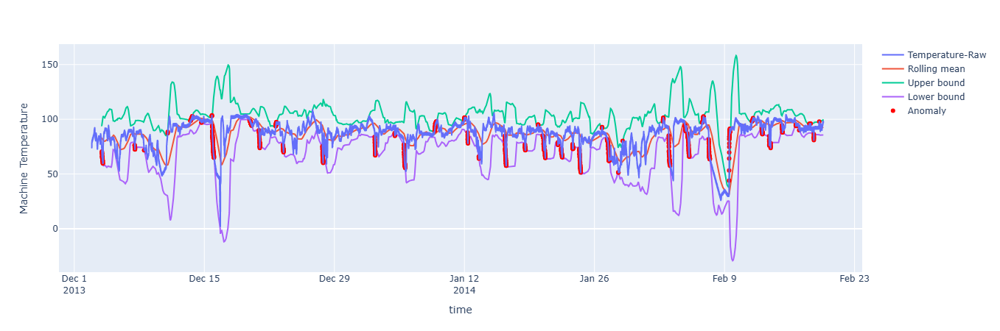

In [18]:
plot_temp_over_time_plotly(use_mode='mean/std', plot_rolling=True, plot_threshold=True, plot_anomaly=True)

#### Z score - Rolling median & Rolling MAD

In [19]:
plot_temp_over_time_plotly(use_mode='median/mad', plot_rolling=True, plot_threshold=True, plot_anomaly=True)

#### Z score - Conclusion
- Z score method is sensitive to rolling window for anomaly detection.
- Rolling mean/std vs rolling median/MAD
  - Thresholds from both ways reflects sensitively to peak value
  - Rolling window is 300: Threshold remains similar level when temperatue is not in drift area. It is observed that threshold of rolling median/MAD turns out changing more dramatically than rolling mean/std during peak area.
  - Reason of sudden jump is that middle position changes to high value as rolling calculation goes on. It then contributes sudden jump in median then MAD
- Rolling window affects threshold profile (threshold becomes too big during anomaly period) and then anomaly detection capability --> Need to think of other robust way for anomaly detection

In [20]:
# Play: Use differencing --> Observe mean brought to zero
df_arima_normal['value_diff'] = df_arima_normal['value'].diff()
fig = px.line(df_arima_normal,
              x='time', 
              y='value_diff', 
              title='Temperature-Differenced', 
              labels={'time': 'Time', 'value': 'Temperature'})
fig.show()

NameError: name 'df_arima_normal' is not defined

In [ ]:
df_arima_normal_only_order_selection = df_arima_normal.dropna(subset=['value_diff'], axis=0)
df_arima_normal_only_order_selection

In [ ]:
# Augmented Dickey Fuller for stantionary check
result = adfuller(df_arima_normal_only_order_selection['value_diff'], regression='c', autolag='AIC')
print('ADF w/ differencing')
print(f'ADF statistics: {result[0]}')
print(f'p-value: {result[1]}')
print(f'Used lags: {result[2]}')
print(f'Critical value: {result[4]}')

With differencing, normal period is considered stationary (mean and std is constant over time)

In [ ]:
fig, ax = plt.subplots(2, 1, figsize=(16, 10))
plot_pacf(df_arima_normal_only_order_selection['value_diff'], lags=50, method='ywm', alpha=0.05, ax=ax[0])
ax[0].set_xlabel('Lag')
ax[0].set_ylabel('Coefficient')
ax[0].set_ylim(-0.4,1)
ax[0].set_title('Partial Autocorrelation-w/ differencing')


plot_acf(df_arima_normal_only_order_selection['value_diff'], lags=50, ax=ax[1])
ax[1].set_xlabel('Lag')
ax[1].set_ylabel('Coefficient')
ax[1].set_ylim(-0.4,1)
ax[1].set_title('Autocorrelation-w/ differencing')

fig.show()

Without differencing: PACF shows lag 1 to 9 exceeding blue zone, meaning they are significant to value forecasting with past values. Choose p=9.  
With differencing: PACF shows lag 1 to 6 are significant to value forecasting. Choose p=6

Without differencing: ACF sees a trend behavior till around 300 lags (25 hours lag)  
With differencing: Till lag 8 (except for lag 7) ACF shows significant on forecating. Choose q as 8.

Due to stationary without differencing, try ARIMA with order=(9, 0, 8)

Observation - order (8, 0, 9)
- Threshold 2.9 degree is too small for the machine temperature anomaly window
- The model seems overfitted. We need to choose another order

Order selection
- PACF: p is chosen as 1 or 2 at most (maybe 3)
- ACF: it is trending, meaning it is not stationary. We need differencing. d = 1 and q is 1 or 2 at most
- (1, 1, 1), (1, 1, 2), (2, 1, 1), (2, 1, 2)

In [ ]:
# Find the best order combination
orders = [(1, 1, 1), (1, 1, 2), (1, 1, 3), (2, 1, 1), (2, 1, 2), (2, 1, 3), (9, 0, 8)]
for order in orders:
    arima_model = ARIMA(df_arima_normal['value'], order=order)
    res = arima_model.fit()
    print(f'The chosen order: {order}')
    print(f'AIC: {res.aic:.3f}')
    print(f'BIC: {res.bic:.3f}')
    print('========================')

Order(1 , 1, 2) has the lowest BIC. Indicating overfitting is penalized.

In [ ]:
# ARIMA training
arima_model = ARIMA(df_arima_normal['value'], order=(1, 1, 2))
fitted_arima = arima_model.fit()

In [ ]:
# Get the ARIMA fitted value
df_arima_normal['Predicted value'] = fitted_arima.fittedvalues
df_arima_normal_threshold = df_arima_normal.iloc[1:]
df_arima_normal_threshold

In [ ]:
# Get the residual mean and std for threshold
df_arima_normal_threshold['Residual'] = df_arima_normal_threshold['value'] - df_arima_normal_threshold['Predicted value']
resid_mean = df_arima_normal_threshold['Residual'].mean()
resid_std = df_arima_normal_threshold['Residual'].std()
threshold_resid = resid_mean + 3 * resid_std
print(f'Residual mean at normal period: {resid_mean}')
print(f'Residual std at normal period: {resid_std}')
print(f'Threshold of residual: {threshold_resid}')

In [ ]:
# Visualize actual and predicted value at normal
fig = go.Figure()

fig.add_trace(go.Scatter(x=df_arima_normal_threshold['time'],
                         y=df_arima_normal_threshold['value'],
                         name='Actual',
                        )
             )
fig.add_trace(go.Scatter(x=df_arima_normal_threshold['time'],
                         y=df_arima_normal_threshold['Predicted value'],
                         name='Predicted'
                        )
             )

fig.update_layout(template='simple_white',
                  font=dict(size=14),
                  xaxis_title='Time',
                  yaxis_title='Temperature',
                  width=1200,
                  height=400,
                  title='Normal period - Actual vs Predicted')
fig.show()

In [ ]:
# To resolve the memory gap issue, concatenate a few rows from normal period
df_arima_normal_concat = df_arima_normal_threshold.iloc[-5:][['timestamp', 'value', 'time', 'year', 'month', 'day', 'hour', 'minute', 'anomaly_point', 'anomaly_window']] 
df_arima_test_2_pred = pd.concat([df_arima_normal_concat, df_arima_test_2])
df_arima_test_2_pred.head(10)

In [ ]:
df_arima_test_2

In [ ]:
# Use walk forward one step forecasting
res_test = fitted_arima.apply(df_arima_test_2_pred['value'])
pred = res_test.get_prediction(dynamic=False)
df_arima_test_2['Predicted value'] = pred.predicted_mean  # Return predicted value
df_arima_test_2['Residual'] = df_arima_test_2['value'] - df_arima_test_2['Predicted value']
df_arima_test_2
# # The following is too slow
# test2_pred = []
# pred2_arima_no_diff = fitted_arima_no_diff
# counter = 0
# for y_test in df_arima_test_2['value']:
#     y_pred = pred2_arima_no_diff.forecast(1).iloc[0]
#     test2_pred.append(y_pred)
#     pred2_arima_no_diff = pred2_arima_no_diff.append([y_test], refit=False)  # Update ARIMA with the latest point
#     counter += 1
#     print(f'This is {counter}th run')

In [ ]:
df_arima_test_2_anomaly_detected = df_arima_test_2[df_arima_test_2['Residual'].abs() >= threshold_resid]
df_arima_test_2_anomaly = df_arima_test_2[df_arima_test_2['anomaly_point'] == 1]

fig = go.Figure()

fig.add_trace(go.Scatter(x=df_arima_test_2['time'],
                         y=df_arima_test_2['value'],
                         name='Actual',
                        )
             )

fig.add_trace(go.Scatter(x=df_arima_test_2['time'],
                         y=df_arima_test_2['Predicted value'],
                         name='Predicted'
                        )
             )

fig.add_trace(go.Scatter(x=df_arima_test_2_anomaly_detected['time'],
                         y=df_arima_test_2_anomaly_detected['value'],
                         mode='markers',
                         marker=dict(size=8,color='orange',symbol='circle'),
                         name='Anomaly detected'
                        )
             )

fig.add_trace(go.Scatter(x=df_arima_test_2_anomaly['time'], 
                         y=df_arima_test_2_anomaly['value'],
                         mode='markers',
                         marker=dict(size=8,color='red',symbol='circle'),
                         name='True anomaly'
                        )
             )

fig.update_layout(template='simple_white',
                  font=dict(size=14),
                  xaxis_title='Time',
                  yaxis_title='Temperature',
                  width=1200,
                  height=400,
                  title='Test_2 - Actual vs Predicted')
fig.show()

In [ ]:
df_iso = df.copy()
df_iso.head()

In [ ]:
# # Setting choice
# contamination_list = [0.05, 0.1, 0.12, 0.15, 0.18, 0.2]
# n_estimators_list = [100, 200, 300, 500]

# # For loop for all possible choices
# for cont in contamination_list:
#     for est in n_estimators_list:
#         model_isolation = IsolationForest(contamination=cont, n_estimators=est, random_state=42)
#         model_isolation.fit(df_iso[['value']])  # Create isolation trees
#         iso_pred = model_isolation.predict(df_iso[['value']])  # Calculate the average path to be isolated and retrun anomaly(-1)/ normal(1)
#         df_iso['Isolation Prediction'] = iso_pred
#         df_iso['Isolation Prediction'] = df_iso['Isolation Prediction'].apply(value_change)

#         print(f'contamination setting: {cont}')
#         print(f'n_estimators setting: {est}')
#         plot_eva(df_iso)
#         plot_anomaly_detection_iso(df_iso)
#         print('\n')

In [ ]:
model_isolation = IsolationForest(contamination=0.12, n_estimators=300, random_state=42)
model_isolation.fit(df_iso[['value']])  # Create isolation trees
iso_pred = model_isolation.predict(df_iso[['value']])  # Calculate the average path to be isolated and retrun anomaly(-1)/ normal(1)
df_iso['Isolation Prediction'] = iso_pred
df_iso['Isolation Prediction'] = df_iso['Isolation Prediction'].apply(value_change)
df_iso

In [ ]:
# Using rolling mean of the past points as consistency window
windows = [12, 18, 24]  # Use 60, 90, 120 mins for consistency window
for window in windows:
    df_iso[f'Consistency result - {window * 5}mins'] = df_iso['Isolation Prediction'].rolling(window).mean()
df_iso

In [ ]:
for window in windows:
    plot_anomaly_detection_iso(df_iso, consistency_window=window, consistency_check=True)
    plot_eva(df_iso, consistency_window=window, consistency_check=True)

In [ ]:
df_iso.head()

In [ ]:
# Remove rolling columns
drop_window_columns(df_iso)
df_iso.head()

In [ ]:
df_iso_2_train = df.copy().iloc[:int(0.7 * df.shape[0])]
df_iso_2_test = df.copy().iloc[int(0.7 * df.shape[0]):]
df_iso_2 = df.copy()

In [ ]:
df_iso_2_train

In [ ]:
df_iso_2_test

In [ ]:
# # Setting choice
# contamination_list = [0.05, 0.1, 0.12, 0.15, 0.18, 0.2]
# n_estimators_list = [100, 200, 300, 500]

# # For loop for all possible choices
# for cont in contamination_list:
#     for est in n_estimators_list:
#         model_isolation = IsolationForest(contamination=cont, n_estimators=est, random_state=42)
#         model_isolation.fit(df_iso_2_train[['value']])  # Create isolation trees
#         iso_pred = model_isolation.predict(df_iso_2_train[['value']])  # Calculate the average path to be isolated and retrun anomaly(-1)/ normal(1)
#         df_iso_2_train['Isolation Prediction'] = iso_pred
#         df_iso_2_train['Isolation Prediction'] = df_iso_2_train['Isolation Prediction'].apply(value_change)

#         print(f'contamination setting: {cont}')
#         print(f'n_estimators setting: {est}')
#         plot_eva(df_iso_2_train)
#         plot_anomaly_detection_iso(df_iso_2_train)
#         print('\n')

In [ ]:
model_isolation_2 = IsolationForest(contamination=0.05, n_estimators=500, random_state=42)

model_isolation_2 = IsolationForest(contamination=0.12, n_estimators=300, random_state=42)
model_isolation_2.fit(df_iso_2_train[['value']])  # Create isolation trees
iso_pred_2_test = model_isolation_2.predict(df_iso_2_test[['value']])  # Calculate the average path to be isolated and retrun anomaly(-1)/ normal(1)
df_iso_2_test['Isolation Prediction'] = iso_pred_2_test
df_iso_2_test['Isolation Prediction'] = df_iso_2_test['Isolation Prediction'].apply(value_change)
plot_eva(df_iso_2_test)
plot_anomaly_detection_iso(df_iso_2_test)

In [ ]:
iso_pred_2 = model_isolation_2.predict(df_iso_2[['value']])  # Calculate the average path to be isolated and retrun anomaly(-1)/ normal(1)
df_iso_2['Isolation Prediction'] = iso_pred_2
df_iso_2['Isolation Prediction'] = df_iso_2['Isolation Prediction'].apply(value_change)
plot_eva(df_iso_2)
plot_anomaly_detection_iso(df_iso_2)

In [ ]:
# Using rolling mean of the past points as consistency window
windows = [12, 18, 24]  # Use 60, 90, 120 mins for consistency window
for window in windows:
    df_iso_2_test[f'Consistency result - {window * 5}mins'] = df_iso_2_test['Isolation Prediction'].rolling(window).mean()
df_iso_2_test

In [ ]:
for window in windows:
    plot_anomaly_detection_iso(df_iso_2_test, consistency_window=window, consistency_check=True)
    plot_eva(df_iso_2_test, consistency_window=window, consistency_check=True)

In [ ]:
# Remove rolling columns
drop_window_columns(df_iso_2_test)
df_iso_2_test.head()

In [ ]:
# Using rolling mean of the past points as consistency window
windows = [12, 18, 24]  # Use 60, 90, 120 mins for consistency window
for window in windows:
    df_iso_2[f'Consistency result - {window * 5}mins'] = df_iso_2['Isolation Prediction'].rolling(window).mean()
df_iso_2

In [ ]:
for window in windows:
    plot_anomaly_detection_iso(df_iso_2, consistency_window=window, consistency_check=True)
    plot_eva(df_iso_2, consistency_window=window, consistency_check=True)